# Use spectra of CTIO Data in June 2017 to do atmospheric studies
==================================================================================================
## Look at equivalent width

- author : Sylvie Dagoret-Campagne
- date   : June 13th 2017

This notebook is supposed to perform an atmospheric properties measurement on spectra

In [116]:
%%javascript
var kernel = IPython.notebook.kernel;
var thename = window.document.getElementById("notebook_name").innerHTML;
var command = "theNotebook = " + "'"+thename+"'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [117]:
print theNotebook

AnaEqWdtCalibSpectrum


In [118]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import matplotlib as mpl
from astropy.modeling import models
from astropy import units as u
from astropy import nddata
from astropy.io import fits
import re
import os
import pandas as pd

In [119]:
from matplotlib.backends.backend_pdf import PdfPages

In [120]:
import ccdproc
print 'ccdproc version',ccdproc.__version__

from astropy.modeling import models

ccdproc version 1.0.1


In [121]:
from scipy import stats  
from scipy import ndimage
from datetime import datetime, timedelta
from mpl_toolkits.mplot3d import Axes3D
import scipy.signal
from scipy.interpolate import interp1d

In [122]:
import bottleneck as bn  # numpy's masked median is slow...really slow (in version 1.8.1 and lower)
print 'bottleneck version',bn.__version__

bottleneck version 1.2.0


In [123]:
import photutils
from astropy.stats import sigma_clipped_stats
from photutils import daofind
from photutils import CircularAperture
from astropy.visualization import SqrtStretch
from astropy.visualization.mpl_normalize import ImageNormalize
#from photutils.background import Background2D
from photutils import Background2D, SigmaClip, MedianBackground

In [124]:
import sys
sys.path.append("../../common_tools/")
from holo_specs import *

In [125]:
%load_ext Cython

The Cython extension is already loaded. To reload it, use:
  %reload_ext Cython


In [126]:
from IPython.display import Image, display

In [127]:
import matplotlib
matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

In [128]:
# to enlarge the sizes
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (10, 10),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
plt.rcParams.update(params)

In [129]:
%config InlineBackend.rc = {}
matplotlib.rc_file("../../templates/matplotlibrc")

In [130]:
from scipy.interpolate import interp1d

In [131]:
import datetime
from dateutil import parser  # very usefull time format smart parser

In [132]:
from matplotlib.dates import MonthLocator, WeekdayLocator,DateFormatter
from matplotlib.dates import MONDAY

In [133]:
mondays = WeekdayLocator(MONDAY)
months = MonthLocator(range(1, 13), bymonthday=1, interval=1)
monthsFmt = DateFormatter("%b '%y")

In [134]:
import matplotlib.dates as mdates

years = mdates.YearLocator()   # every year
months = mdates.MonthLocator()  # every month
days=mdates.DayLocator()  # every day
hour=mdates.HourLocator()  # every day
yearsFmt = mdates.DateFormatter('%Y')

In [135]:
# to enlarge the sizes
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (4, 4),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
plt.rcParams.update(params)

In [136]:
############################################################################
def ensure_dir(f):
    d = os.path.dirname(f)
    if not os.path.exists(f):
        os.makedirs(f)
#########################################################################

In [137]:
inputdir="./spectrum_calibspec"
MIN_IMGNUMBER=141
MAX_IMGNUMBER=175
object_name='HD205905 May 31th 2017'
SelectTagRe='^calibSpectra_20170531_([0-9]+).fits$' # regular expression to select the file
SearchTagRe='^calibSpectra_20170531_[0-9]+.fits$'
NBIMGPERROW=2

In [138]:
outputdir="./spectrum_ana"

In [139]:
ensure_dir(outputdir)

In [140]:
output_file='AnaEqWdtFromSpectra_'+object_name+'.csv'

In [141]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images

In [142]:
ensure_dir(dir_top_images) # create that directory

## Location of calibrated spectra and Simulations
----------------------------------

In [143]:
input_filelist=os.listdir(inputdir) 

In [144]:
if '.DS_Store' in input_filelist:
    input_filelist.remove('.DS_Store')
input_filelist=np.array(input_filelist)

In [145]:
print input_filelist[0:5]

['calibSpectra_20170531_143.fits' 'calibSpectra_20170531_144.fits'
 'calibSpectra_20170531_145.fits' 'calibSpectra_20170531_146.fits'
 'calibSpectra_20170531_147.fits']


In [146]:
indexes_files= [] # global list
filelist_fitsimages= []  # global list

In [147]:
#%%cython

import numpy as np
import re

def MakeFileList(inputdir,input_filelist):
    """
    MakeFileList : Make The List of files to open
    =============
    """
    
#    import numpy as np
#    import re
    indexes_files= [] # global list
    filelist_fitsimages= []  # global list
    
    for file in input_filelist: # loop on directories, one per image       
            filename=inputdir+'/'+file 
            
            if re.search('.*fits$',filename):  #example of filename filter
                
                num_str=re.findall(SelectTagRe,file)[0]
               
                index=int(num_str)
                filelist_fitsimages.append(filename)
                indexes_files.append(index)   
                
                
    return indexes_files, filelist_fitsimages

In [148]:
indexes_files, filelist_fitsimages=MakeFileList(inputdir,input_filelist)   # filter to select fits file only

In [149]:
# transform into numpy arrays
indexes_files=np.array(indexes_files)
filelist_fitsimages=np.array(filelist_fitsimages)

In [150]:
print indexes_files

[143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160
 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175]


In [151]:
sorted_indexes=np.argsort(indexes_files) # sort the file indexes

In [152]:
sorted_numbers=indexes_files[sorted_indexes]

In [153]:
print sorted_indexes

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32]


In [154]:
#sorted_files= [filelist_fitsimages[index] for index in sorted_indexes] # sort files
sorted_files=filelist_fitsimages[sorted_indexes]

In [155]:
sorted_files[0:5]

array(['./spectrum_calibspec/calibSpectra_20170531_143.fits',
       './spectrum_calibspec/calibSpectra_20170531_144.fits',
       './spectrum_calibspec/calibSpectra_20170531_145.fits',
       './spectrum_calibspec/calibSpectra_20170531_146.fits',
       './spectrum_calibspec/calibSpectra_20170531_147.fits'], 
      dtype='|S51')

## Build full filename
----------------------------

In [156]:
sorted_filenames=[]
for file in sorted_files:
    #fullfilename=os.path.join(inputdir,file)
    fullfilename=file
    sorted_filenames.append(fullfilename)

In [157]:
#sorted_filenames=np.array(sorted_filenames)
sorted_filenames=np.copy(sorted_files)

In [158]:
print sorted_filenames.shape

(33,)


## Acces to spectrum data
----------------------------------

In [159]:
%%cython

import numpy as np
from astropy.io import fits

def BuildCalibSpec(sorted_filenames,sorted_numbers,object_name):
    """
    BuildRawSpec
    ===============
    """

    all_dates = []
    all_airmass = []
    all_leftspectra_data = []
    all_rightspectra_data = []
    
    all_leftspectra_wl = []
    all_rightspectra_wl = []
    all_titles = []
    all_header = []
    all_expo = []
    all_filt= []
   
    NBFILES=sorted_filenames.shape[0]

    for idx in range(NBFILES):  
        
        file=sorted_filenames[idx]    
        
        hdu_list=fits.open(file)
        
        #hdu_list.info()
        
        header=hdu_list[0].header
        #print header
        date_obs = header['DATE-OBS']
        airmass = header['AIRMASS']
        expo = header['EXPTIME']
        num=sorted_numbers[idx]
        title=object_name+" z= {:3.2f} Nb={}".format(float(airmass),num)
        filters = header['FILTERS'].split(' ')[1]
        
        # now reads the spectra
        
        table_data=hdu_list[1].data
        
        #cols = hdu_list[1].columns
        #cols.info()
        #print hdu_list[1].columns
        #cols.names
  
        #col1=fits.Column(name='CalibLeftSpecWL',format='E',array=theleftwl_cut[idx[0]])
        #col2=fits.Column(name='CalibLeftSpecData',format='E',array=theleftspectrum_cut[idx[0]])
        #col3=fits.Column(name='CalibLeftSpecSim',format='E',array=theleftsimspec_cut[idx[0]])
        #col4=fits.Column(name='CalibRightSpecWL',format='E',array=therightwl_cut[idx[0]])
        #col5=fits.Column(name='CalibRightSpecData',format='E',array=therightspectrum_cut[idx[0]])
        #col6=fits.Column(name='CalibRightSpecSim',format='E',array=therightsimspec_cut[idx[0]])
    
    
        left_spectrum_wl=table_data.field('CalibLeftSpecWL')
        left_spectrum_data=table_data.field('CalibLeftSpec')
       
        
        right_spectrum_wl=table_data.field('CalibRightSpecWL')
        right_spectrum_data=table_data.field('CalibRightSpec')
       
        
        all_dates.append(date_obs)
        all_airmass.append(float(airmass))
        
        all_leftspectra_data.append(left_spectrum_data)
        all_rightspectra_data.append(right_spectrum_data)
        
        all_leftspectra_wl.append(left_spectrum_wl)
        all_rightspectra_wl.append(right_spectrum_wl)
        
       
        
        all_titles.append(title)
        all_header.append(header)
        all_expo.append(expo)
        
        all_filt.append(filters)
            
        hdu_list.close()
        
    return all_dates,all_airmass,all_titles,all_header,all_expo, all_leftspectra_data,all_rightspectra_data, all_leftspectra_wl,all_rightspectra_wl,        all_filt

In [160]:
all_dates,all_airmass,all_titles,all_header,all_expo,all_leftspectra_data,all_rightspectra_data,all_leftspectra_wl,all_rightspectra_wl,all_filt=BuildCalibSpec(sorted_files,sorted_numbers,object_name)

In [161]:
NDATA=len(all_dates)

In [162]:
all_dt=all_dates

## Airmasses

In [163]:
NDATA=len(all_rightspectra_data)
all_dt= [ parser.parse(all_dates[i]) for i in range(NDATA)]

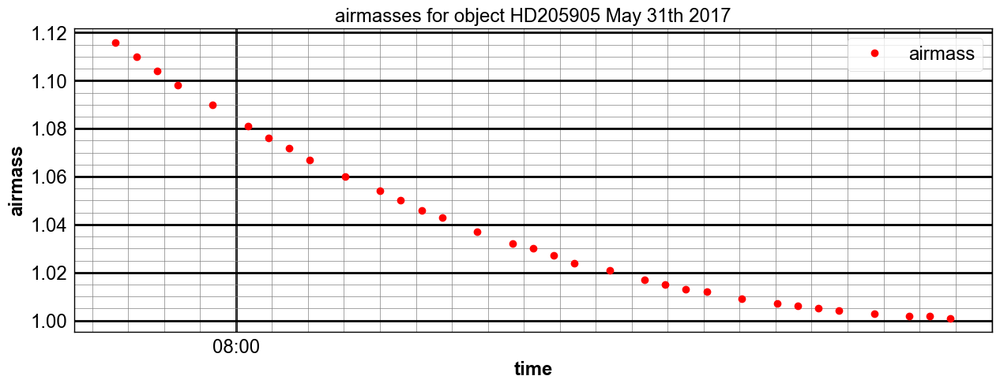

In [164]:
fig=plt.figure(figsize=(15,5))

ax=fig.add_subplot(1,1,1)
ax.plot_date(all_dt, all_airmass,marker='o',color='red',lw=0,label='airmass',linewidth=3)
#ax.plot_date(all_dt, am,marker='.',color='blue',lw=0,label='relative airmass',linewidth=3)

#ax.set_ylim(0.,2)

date_range = all_dt[NDATA-1] - all_dt[0]

if date_range > datetime.timedelta(days = 1):
    ax.xaxis.set_major_locator(mdates.DayLocator(bymonthday=range(1,32), interval=1))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
    ax.get_xaxis().set_minor_locator(mdates.HourLocator(byhour=range(0,24,2)))
    #ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
else:
    ax.xaxis.set_major_locator(mdates.HourLocator(byhour=range(0,24,2)))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    #ax.get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
    ax.get_xaxis().set_minor_locator(mdates.MinuteLocator(byminute=range(0,60,5)))
    
ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())

ax.grid(b=True, which='major', color='k', linewidth=2.0)
ax.grid(b=True, which='minor', color='grey', linewidth=0.5)
ax.set_ylabel('airmass')
ax.set_xlabel('time')


title='airmasses for object {}'.format(object_name)

plt.title(title)
plt.legend(loc='best')

figfilename=os.path.join(dir_top_images,'airmass_vs_time.pdf')
fig.savefig(figfilename)

## Dispersers

In [165]:
ListOfDisperserNames=['Ron400', 'Thor300', 'HoloPhP', 'HoloPhAg', 'HoloAmAg']

## Show Spectra
-----------------------

In [166]:
%%cython
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import math as m
import os

from matplotlib.backends.backend_pdf import PdfPages
    
def ShowSpectra(all_spectra,all_wl,all_titles,object_name,all_filt,dir_top_img):
    """
    ShowSpectra: Show the raw images without background subtraction
    ==============
    """
    NBSPEC=len(all_spectra)
    NBIMGPERROW=2
    MAXIMGROW=max(2,m.ceil(NBSPEC/NBIMGPERROW))
    #MAXIMGROW=int(MAXIMGROW)
        
    
     # fig file specif
    NBIMGROWPERPAGE=5  # number of rows per pages
    PageNum=0          # page counter
    
    figfilename=os.path.join(dir_top_img,'intput_calibrated_spectra.pdf')
    pp = PdfPages(figfilename) # create a pdf file
    
    title='Calibrated spectra for {}'.format(object_name)
         
    thex0 = []  # container of central position   
        
    
    for index in np.arange(0,NBSPEC):
        if index%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            f, axarr = plt.subplots(NBIMGROWPERPAGE,NBIMGPERROW,figsize=(25,30))
            f.suptitle(title,size=20,fontweight='bold')
            
        indexcut=index-PageNum*(NBIMGROWPERPAGE*NBIMGPERROW)    
        ix=indexcut%NBIMGPERROW
        iy=indexcut/NBIMGPERROW
        
        
        spectrum=all_spectra[index]
       
        wl=all_wl[index]
        axarr[iy,ix].plot(wl,spectrum,'r-',lw=2,label='data')
        
        
        max_y_to_plot=spectrum[:].max()*1.2
        axarr[iy,ix].set_ylim(0.,max_y_to_plot)
        axarr[iy,ix].text(0.,max_y_to_plot*1.1/1.2, all_filt[index],verticalalignment='top', horizontalalignment='left',color='blue',fontweight='bold', fontsize=20)
       
        axarr[iy,ix].set_title(all_titles[index])
        #axarr[iy,ix].set_title(all_filt[index])
        axarr[iy,ix].set_xlabel("wavelength (nm)")
        
        axarr[iy,ix].get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
        axarr[iy,ix].get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
        axarr[iy,ix].grid(b=True, which='major', color='k', linewidth=2.0)
        axarr[iy,ix].grid(b=True, which='minor', color='grey', linewidth=0.5)
      
        # save a new page
        if (index+1)%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            PageNum+=1  # increase page Number
            f.savefig(pp, format='pdf')
            f.show()
        
          
    
    f.savefig(pp, format='pdf') 
    f.show()
    pp.close()
    

### Work only on right spectra

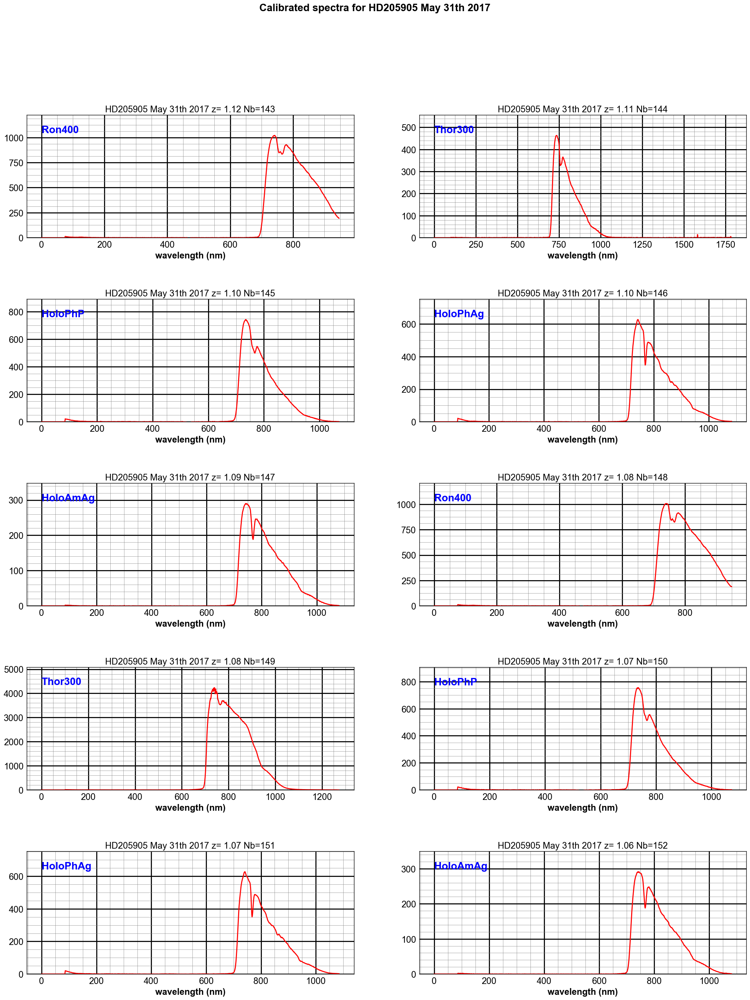

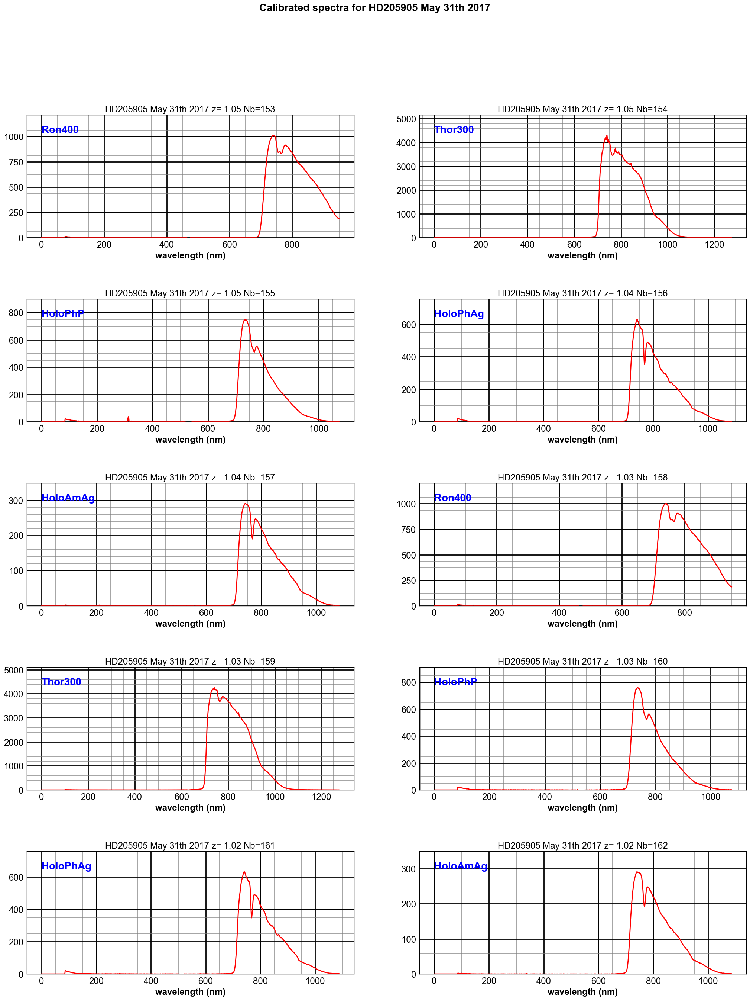

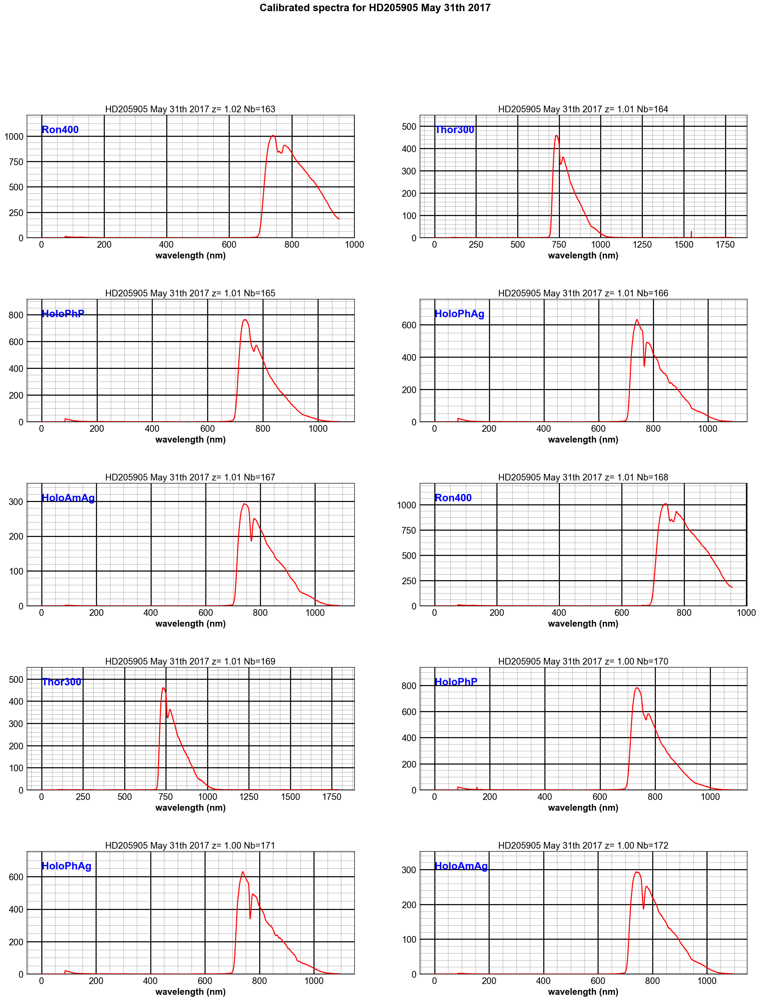

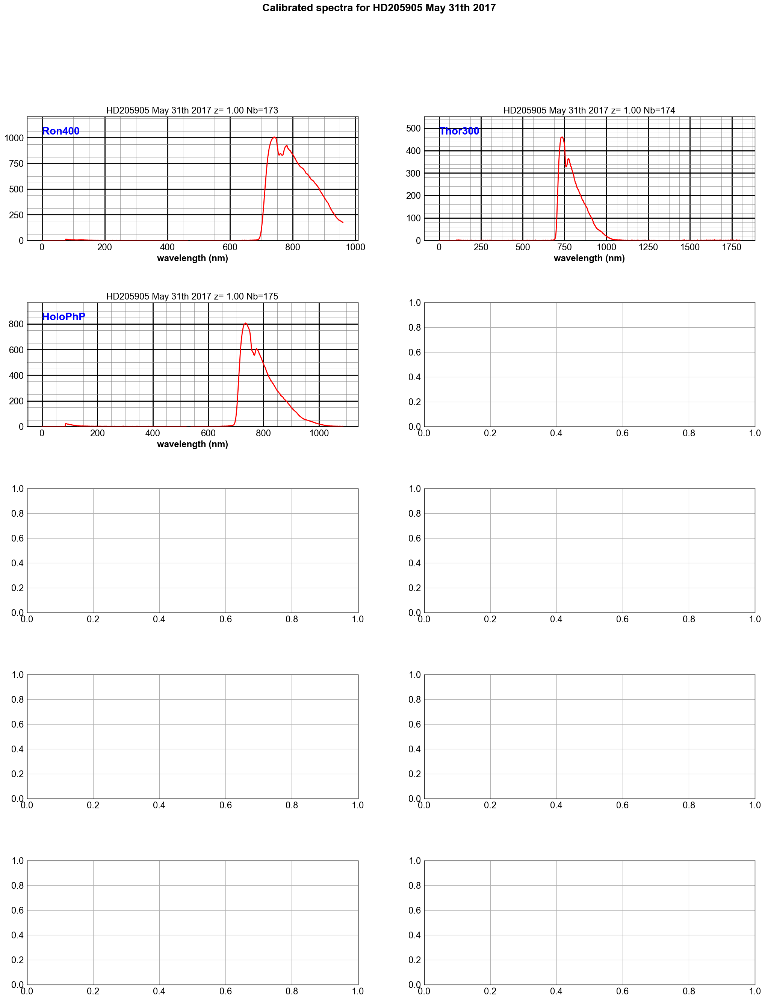

In [167]:
ShowSpectra(all_rightspectra_data,all_rightspectra_wl,all_titles,object_name,all_filt,dir_top_images)

In [168]:
wl_O2Aline=759.37      # Balmer Lines
wl_O2Bline=686.719
wl_Haline=656.281 
wl_Hbline=486.134
wl_Hgline=434.047 
wl_Hdline=410.175
wl_Heline=397.0

In [169]:
def ShowOneSpectrum(sel):
    """
    ShowOneSpectrum
    ================
    """


    thespectrum=all_rightspectra_data[sel]


    thewl=all_rightspectra_wl[sel]
    ymin=thespectrum.min()
    ymax=thespectrum.max()*1.1

    fig, ax = plt.subplots(1, 1, figsize=(15,8))


    ax.plot(thewl,thespectrum,'b-',lw=2)

    max_y_to_plot=thespectrum[:].max()*1.2
    ax.set_ylim(0.,max_y_to_plot)
    ax.text(0.,max_y_to_plot*1.1/1.2, all_filt[sel],verticalalignment='top', horizontalalignment='left',color='blue',fontweight='bold', fontsize=20)

    ax.set_title(all_titles[sel])
    ax.get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
    ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
    ax.grid(b=True, which='major', color='k', linewidth=2.0)
    ax.grid(b=True, which='minor', color='grey', linewidth=0.5)

    ax.plot([wl_O2Aline,wl_O2Aline],[ymin,ymax],'b-',label='$O_2(A)$',lw=1)
    ax.plot([wl_O2Bline,wl_O2Bline],[ymin,ymax],'b-',label='$O_2(B)$',lw=1)
    ax.plot([wl_Haline,wl_Haline],[ymin,ymax],'r-',label='$H_{\\alpha}$',lw=1)
    ax.plot([wl_Hbline,wl_Hbline],[ymin,ymax],'g-',label='$H_{\\beta}$',lw=1)
    ax.plot([wl_Hgline,wl_Hgline],[ymin,ymax],'c-',label='$H_{\\gamma}$',lw=1)
    ax.plot([wl_Hdline,wl_Hdline],[ymin,ymax],'k-',label='$H_{\\delta}$',lw=1)
    ax.plot([wl_Heline,wl_Heline],[ymin,ymax],'y-',label='$H_{\\epsilon}$',lw=1)

    ax.legend(loc='best',fontsize=20)
    ax.set_xlim(0,1100)
    ax.set_xlabel("$\lambda$ (nm)")
    
    figname='one_intput_calibrated_spectra_{}.pdf'.format(sel)
    figfilename=os.path.join(dir_top_images,figname)
    fig.savefig(figfilename)

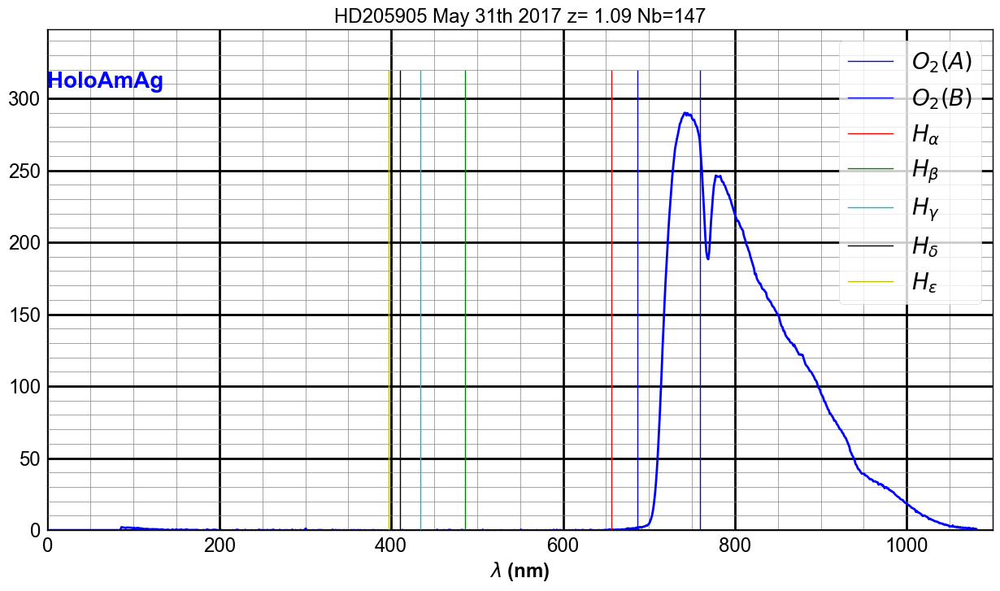

In [170]:
ShowOneSpectrum(4)

In [171]:
def ShowOneSpectrumNextFilt(sel):
    """
    ShowOneSpectrum
    ================
    """

    NBSPECTOPLOT=5
    
    the_spectra= []
    the_wl=[]
    the_max = []
    the_label= []
    
    for i in np.arange(NBSPECTOPLOT):

        the_spectrum=all_rightspectra_data[sel+i]
        thewl=all_rightspectra_wl[sel+i]
        theymin=the_spectrum.min()
        theymax=the_spectrum.max()
        thelabel=all_filt[sel+i]
        
        the_spectra.append(the_spectrum)
        the_wl.append(thewl)
        the_max.append(theymax)
        the_label.append(thelabel)

        
    fig, ax = plt.subplots(1, 1, figsize=(15,8))
    for i in np.arange(NBSPECTOPLOT):        
        ax.plot(the_wl[i],the_spectra[i],lw=3,label=the_label[i])

 
        
    max_y_to_plot=(np.array(the_max)).max()
    ymin=0
    ymax=max_y_to_plot
    ax.set_ylim(0.,max_y_to_plot)
    
    ax.set_title(all_titles[sel])
    ax.get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
    ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
    ax.grid(b=True, which='major', color='k', linewidth=2.0)
    ax.grid(b=True, which='minor', color='grey', linewidth=0.5)

    ax.plot([wl_O2Aline,wl_O2Aline],[ymin,ymax],'b:',label='$O_2(A)$',lw=3)
    ax.plot([wl_O2Bline,wl_O2Bline],[ymin,ymax],'b:',label='$O_2(B)$',lw=3)
    ax.plot([wl_Haline,wl_Haline],[ymin,ymax],'r:',label='$H_{alpha}$',lw=3)
    ax.plot([wl_Hbline,wl_Hbline],[ymin,ymax],'g:',label='$H_{beta}$',lw=3)
    ax.plot([wl_Hgline,wl_Hgline],[ymin,ymax],'c:',label='$H_{gamma}$',lw=3)
    ax.plot([wl_Hdline,wl_Hdline],[ymin,ymax],'k:',label='$H_{delta}$',lw=3)
    ax.plot([wl_Heline,wl_Heline],[ymin,ymax],'y:',label='$H_{delta}$',lw=3)

    ax.legend(loc='best',fontsize=20)
    ax.set_xlim(0,1100)
    ax.set_xlabel("$\lambda$ (nm)")
    
    figname='five_intput_calibrated_spectra_{}.pdf'.format(sel)
    figfilename=os.path.join(dir_top_images,figname)
    fig.savefig(figfilename)

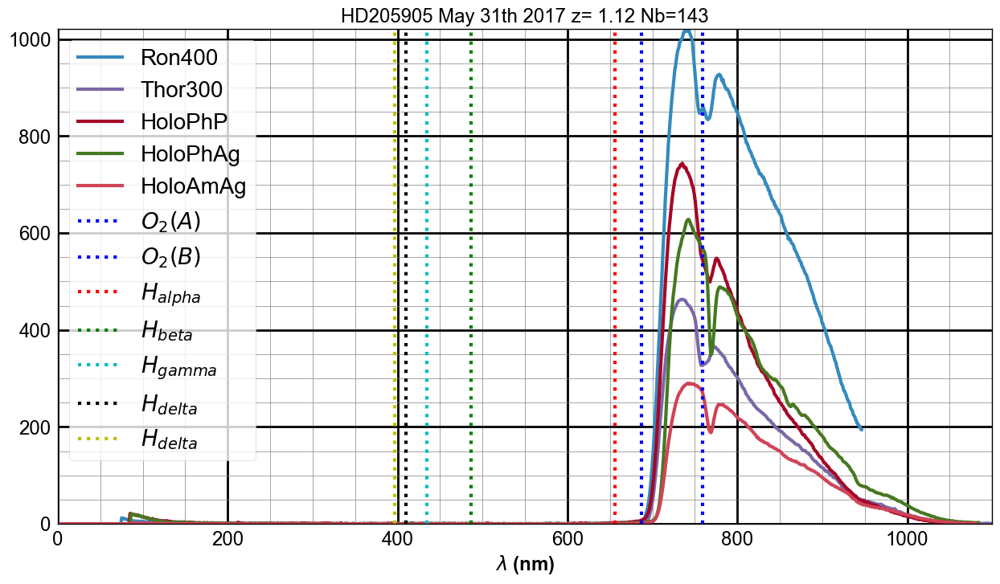

In [172]:
 ShowOneSpectrumNextFilt(0)

# Measurement of Equivalent Width
==============================================

## Select the spectrum under study

In [173]:
sel=0
thespectrum=all_rightspectra_data[sel]
thewl=all_rightspectra_wl[sel]
thelabel=all_filt[sel]

## O2 absorption line

In [174]:
O2WL1=732
O2WL2=744
O2WL3=780
O2WL4=790

In [175]:
def ShowEquivalentWidth(wl,spec,wl1,wl2,wl3,wl4):
    """
    ShowEquivalentWidth : show how the equivalent width must be computed
    """
    selected_indexes=np.where(np.logical_and(wl>=wl1,wl<=wl4))
        
    wl_cut=wl[selected_indexes]
    spec_cut=spec[selected_indexes]
    ymin=spec_cut.min()
    ymax=spec_cut.max()
    
    plt.figure()
    plt.plot(wl_cut,spec_cut)
    plt.plot([wl2,wl2],[ymin,ymax],'r-.',lw=2)
    plt.plot([wl3,wl3],[ymin,ymax],'r-.',lw=2)
    
    
    # continuum fit
    continuum_indexes=np.where(np.logical_or(np.logical_and(wl>=wl1,wl<=wl2),np.logical_and(wl>=wl3,wl<wl4)))
    x_cont=wl[continuum_indexes]
    y_cont=spec[continuum_indexes]
    z_cont_fit=np.polyfit(x_cont, y_cont,1)
        
    pol_cont_fit=np.poly1d(z_cont_fit)
    
    fit_line_x=np.linspace(wl1,wl4,50)
    fit_line_y=pol_cont_fit(fit_line_x)
    
    plt.plot(x_cont,y_cont,'o')
    
    plt.plot(fit_line_x,fit_line_y,'g--',lw=1)
    
    plt.grid(True)
    plt.title('Equivalent width computation')
    
    # compute the ratio spectrum/continuum
    full_continum=pol_cont_fit(wl_cut)    
    ratio=spec_cut/full_continum
    
    plt.figure()
    plt.plot(wl_cut,ratio)
    plt.plot([wl2,wl2],[0,1.2],'r-.',lw=2)
    plt.plot([wl3,wl3],[0,1.2],'r-.',lw=2)
    plt.grid(True)
    
    
    NBBins=len(wl_cut)
    wl_shift_right=np.roll(wl_cut,1)
    wl_shift_left=np.roll(wl_cut,-1)
    wl_bin_size=(wl_shift_left-wl_shift_right)/2. # size of each bin

    
    outside_band_indexes=np.where(np.logical_or(wl_cut<wl2,wl_cut>wl3))
    wl_bin_size[outside_band_indexes]=0  # erase bin width outside the band
                       
    # calculation of equivalent width
    
    absorption_band=wl_bin_size*(1-ratio)
    equivalent_width= absorption_band.sum()
    
    
    return equivalent_width

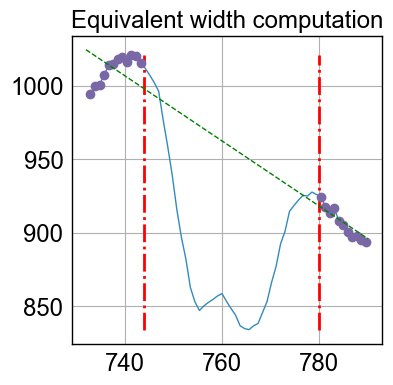

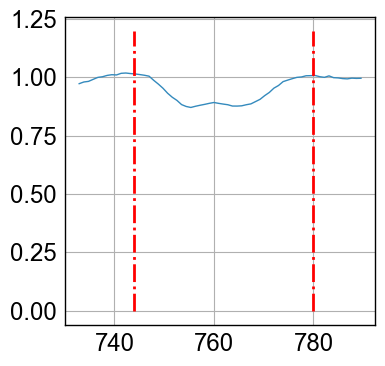

In [176]:
EQW = ShowEquivalentWidth(thewl,thespectrum,O2WL1,O2WL2,O2WL3,O2WL4)

In [177]:
def ComputeEquivalentWidth(wl,spec,wl1,wl2,wl3,wl4):
    """
    ComputeEquivalentWidth : compute the equivalent width must be computed
    """
    selected_indexes=np.where(np.logical_and(wl>=wl1,wl<=wl4))
        
    wl_cut=wl[selected_indexes]
    spec_cut=spec[selected_indexes]
    ymin=spec_cut.min()
    ymax=spec_cut.max()
     
    # continuum fit
    continuum_indexes=np.where(np.logical_or(np.logical_and(wl>=wl1,wl<=wl2),np.logical_and(wl>=wl3,wl<wl4)))
    x_cont=wl[continuum_indexes]
    y_cont=spec[continuum_indexes]
    z_cont_fit=np.polyfit(x_cont, y_cont,1)
        
    pol_cont_fit=np.poly1d(z_cont_fit)
    
    fit_line_x=np.linspace(wl1,wl4,50)
    fit_line_y=pol_cont_fit(fit_line_x)
    
    
    # compute the ratio spectrum/continuum
    full_continum=pol_cont_fit(wl_cut)    
    ratio=spec_cut/full_continum
    

    # compute bin size in the band
    wl_shift_right=np.roll(wl_cut,1)
    wl_shift_left=np.roll(wl_cut,-1)
    wl_bin_size=(wl_shift_left-wl_shift_right)/2. # size of each bin    
    outside_band_indexes=np.where(np.logical_or(wl_cut<wl2,wl_cut>wl3))
    wl_bin_size[outside_band_indexes]=0  # erase bin width outside the band
                                  
    
    # calculation of equivalent width    
    absorption_band=wl_bin_size*(1-ratio)
    equivalent_width= absorption_band.sum()    
    
    return equivalent_width

In [178]:
def ShowEquivalentWidth2(wl,spec,wl1,wl2,wl3,wl4,label='absortion line'):
    """
    ShowEquivalentWidth : show how the equivalent width must be computed
    """
    
    f, axarr = plt.subplots(1,2,figsize=(9,3))
    
    
    ## Figure 1
    ##------------
    selected_indexes=np.where(np.logical_and(wl>=wl1,wl<=wl4))
        
    wl_cut=wl[selected_indexes]
    spec_cut=spec[selected_indexes]
    ymin=spec_cut.min()
    ymax=spec_cut.max()
    
    axarr[0].plot(wl_cut,spec_cut)
    axarr[0].plot([wl2,wl2],[ymin,ymax],'r-.',lw=2)
    axarr[0].plot([wl3,wl3],[ymin,ymax],'r-.',lw=2)
    
    # continuum fit
    continuum_indexes=np.where(np.logical_or(np.logical_and(wl>=wl1,wl<=wl2),np.logical_and(wl>=wl3,wl<wl4)))
    x_cont=wl[continuum_indexes]
    y_cont=spec[continuum_indexes]
    z_cont_fit=np.polyfit(x_cont, y_cont,1)
        
    pol_cont_fit=np.poly1d(z_cont_fit)
    
    fit_line_x=np.linspace(wl1,wl4,50)
    fit_line_y=pol_cont_fit(fit_line_x)
    
    
    axarr[0].plot(x_cont,y_cont,'o')
    axarr[0].plot(fit_line_x,fit_line_y,'g--',lw=1)
    
    axarr[0].grid(True)
    axarr[0].set_xlabel('$\lambda$ (nm)')
    
    # compute the ratio spectrum/continuum
    full_continum=pol_cont_fit(wl_cut)    
    ratio=spec_cut/full_continum
    
    # Figure 2
    #-----------
    axarr[1].plot(wl_cut,ratio)
    axarr[1].plot([wl2,wl2],[0,1.2],'r-.',lw=2)
    axarr[1].plot([wl3,wl3],[0,1.2],'r-.',lw=2)
    axarr[1].grid(True)
    
    axarr[1].set_xlabel('$\lambda$ (nm)')
    
    NBBins=len(wl_cut)
    wl_shift_right=np.roll(wl_cut,1)
    wl_shift_left=np.roll(wl_cut,-1)
    wl_bin_size=(wl_shift_left-wl_shift_right)/2. # size of each bin

    
    outside_band_indexes=np.where(np.logical_or(wl_cut<wl2,wl_cut>wl3))
    wl_bin_size[outside_band_indexes]=0  # erase bin width outside the band
                       
    # calculation of equivalent width
    
    absorption_band=wl_bin_size*(1-ratio)
    equivalent_width= absorption_band.sum()
    
    
    title = 'Equivalent width computation for {}'.format(label)
    f.suptitle(title)
    
    return equivalent_width

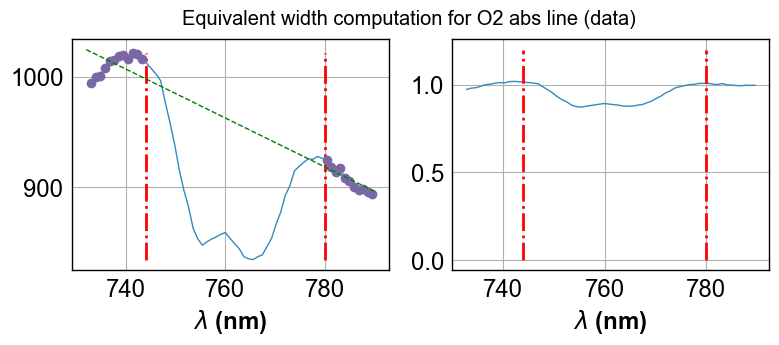

In [179]:
EQW = ShowEquivalentWidth2(thewl,thespectrum,O2WL1,O2WL2,O2WL3,O2WL4,'O2 abs line (data)')

In [180]:
print EQW

2.44793


In [181]:
print ComputeEquivalentWidth(thewl,thespectrum,O2WL1,O2WL2,O2WL3,O2WL4)

2.44793


## A) O2 absorption line
-------------------------------

In [182]:
EQW_DATA_O2 = ComputeEquivalentWidth(thewl,thespectrum,732,744,770,790)

In [183]:
print ' EQW_DATA(O2) = ',EQW_DATA_O2, 'nm'

 EQW_DATA(O2) =  2.07526 nm


In [184]:
WL1_O2_DATA=O2WL1
WL2_O2_DATA=O2WL2
WL3_O2_DATA=O2WL3
WL4_O2_DATA=O2WL4

In [185]:
def ShowAllEquivalentWidth(all_wl,all_spec,wl1,wl2,wl3,wl4,label='absorption line'):
        
    NBSPECTRA=len(all_spec)
    
    for index in np.arange(0,NBSPECTRA):        
        spectrum=all_spec[index]
        wl=all_wl[index]
        
        newlabel = label+ ' for img {} with disp {}'.format(index,all_filt[index]) 
        
        ShowEquivalentWidth2(wl,spectrum,wl1,wl2,wl3,wl4,label=newlabel)


In [186]:
def ComputeAllEquivalentWidth(all_wl,all_spec,wl1,wl2,wl3,wl4):
    
    EQW_coll = []
    
    NBSPECTRA=len(all_spec)
    
    for index in np.arange(0,NBSPECTRA):        
        spectrum=all_spec[index]
        wl=all_wl[index]
        eqw=ComputeEquivalentWidth(wl,spectrum,wl1,wl2,wl3,wl4)
        EQW_coll.append(eqw)
        
    return EQW_coll

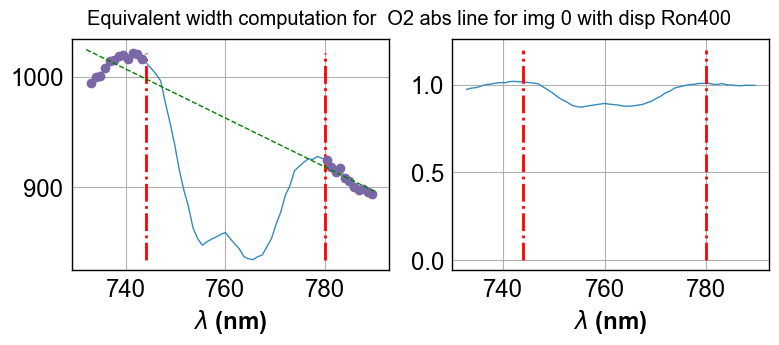

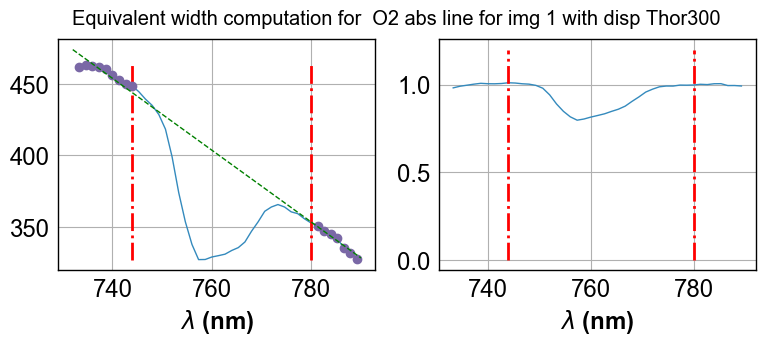

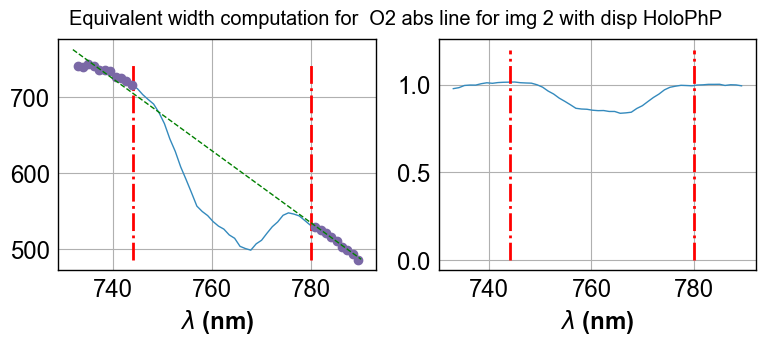

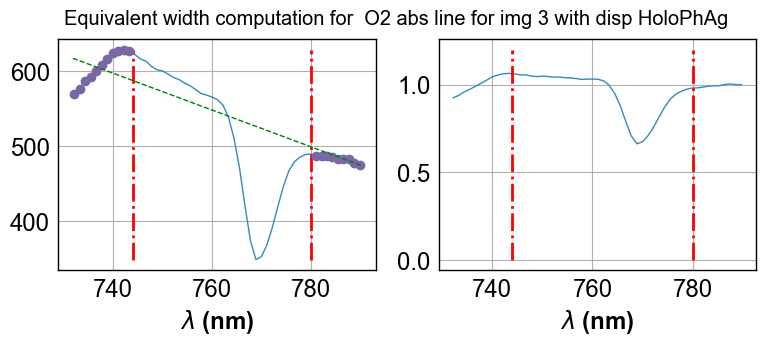

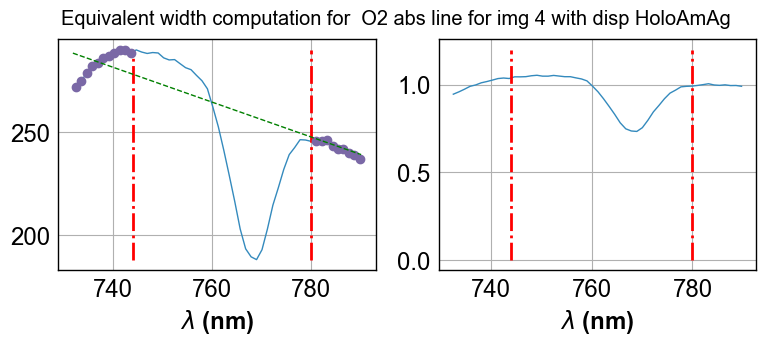

...

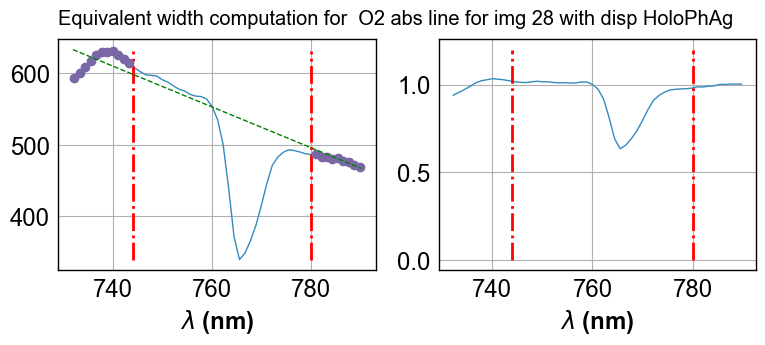

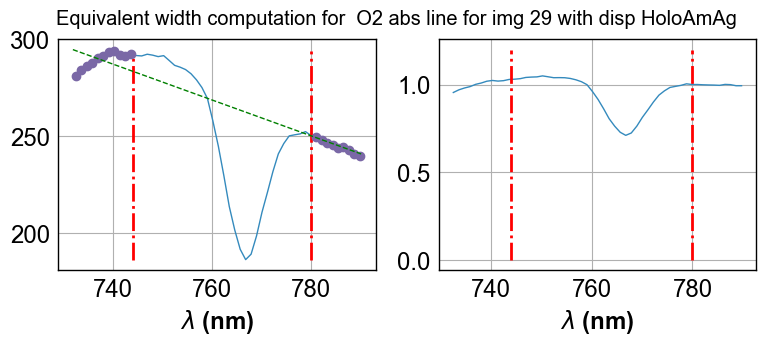

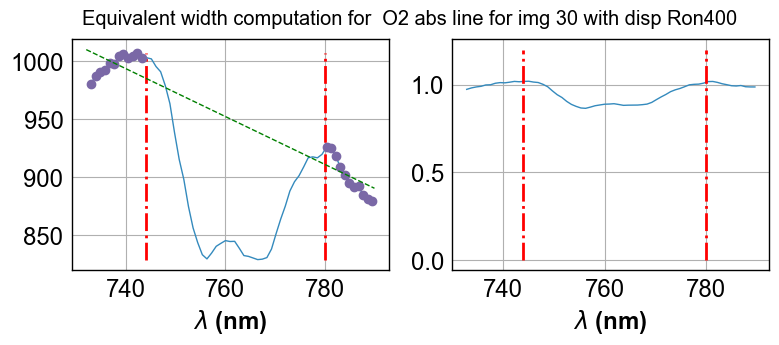

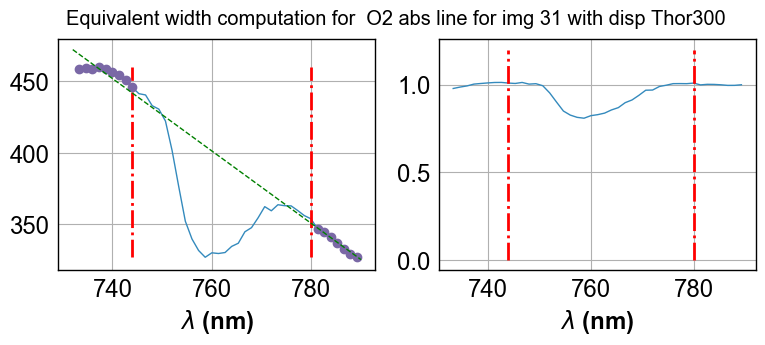

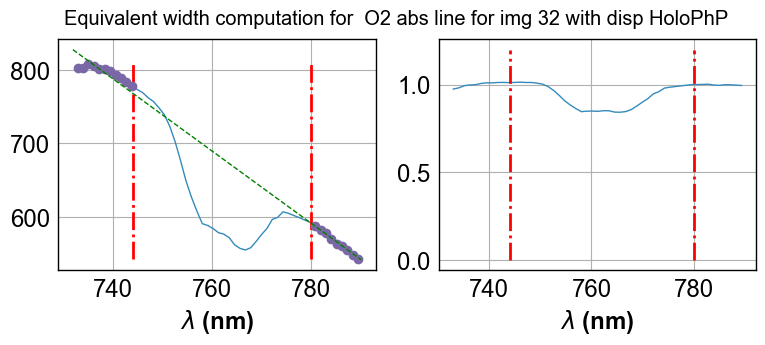

In [187]:
ShowAllEquivalentWidth(all_rightspectra_wl,all_rightspectra_data,WL1_O2_DATA,WL2_O2_DATA,WL3_O2_DATA,WL4_O2_DATA,' O2 abs line')

In [188]:
All_eqw_O2_Data=ComputeAllEquivalentWidth(all_rightspectra_wl,all_rightspectra_data,WL1_O2_DATA,WL2_O2_DATA,WL3_O2_DATA,WL4_O2_DATA)

In [189]:
#All_eqw_O2_Sim=ComputeAllEquivalentWidth(all_rightspectra_wl,all_rightspectra_sim,WL1_O2_SIM,WL2_O2_SIM,WL3_O2_SIM,WL4_O2_SIM)

In [190]:
am=np.array(all_airmass)

In [191]:
ListOfDisperserNames=['Ron400', 'Thor300', 'HoloPhP', 'HoloPhAg', 'HoloAmAg']

In [192]:
def PlotEquivalentWidthVsAirMass(all_eqw_width,all_am,tagabsline,figname):
    """
    """
    am0 = []
    eqw0 = []
    
    am1 = []
    eqw1 = []
    
    am2 = []
    eqw2 = []
    
    am3 = []
    eqw3 = []
    
    am4 = []
    eqw4 = []
    
    
    for index,eqw in np.ndenumerate(all_eqw_width):
        idx=index[0]
        grating_name=all_filt[idx]
        am=all_am[idx]
        
        if re.search(ListOfDisperserNames[0],grating_name):
            am0.append(am)
            eqw0.append(eqw)
        elif re.search(ListOfDisperserNames[1],grating_name):
            am1.append(am)
            eqw1.append(eqw)
        elif re.search(ListOfDisperserNames[2],grating_name):
            am2.append(am)
            eqw2.append(eqw)
        elif re.search(ListOfDisperserNames[3],grating_name):
            am3.append(am)
            eqw3.append(eqw)
        elif re.search(ListOfDisperserNames[4],grating_name):
            am4.append(am)
            eqw4.append(eqw)
        else:
            print 'disperser ',grating_name,' not found'
            
    fig=plt.figure(figsize=(20,8))

    ax=fig.add_subplot(1,1,1)

    ax.plot(am0,eqw0,marker='o',color='red',lw=1,label=ListOfDisperserNames[0])
    ax.plot(am1,eqw1,marker='o',color='blue',lw=1,label=ListOfDisperserNames[1])
    ax.plot(am2,eqw2,marker='o',color='green',lw=1,label=ListOfDisperserNames[2])
    ax.plot(am3,eqw3,marker='o',color='cyan',lw=1,label=ListOfDisperserNames[3])
    ax.plot(am3,eqw4,marker='o',color='magenta',lw=1,label=ListOfDisperserNames[4])
    


    ax.get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())   
    ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())

    ax.grid(b=True, which='major', color='k', linewidth=2.0)
    ax.grid(b=True, which='minor', color='grey', linewidth=0.5)

    ax.set_ylabel('Equivalent width (nm)')
    ax.set_xlabel('AirMass')



    title='Equivalent Width vs airmass for {} for object {}'.format(tagabsline,object_name)

    plt.title(title)
    plt.legend(loc='best')

    figfilename=os.path.join(dir_top_images,figname)
    fig.savefig(figfilename)
 

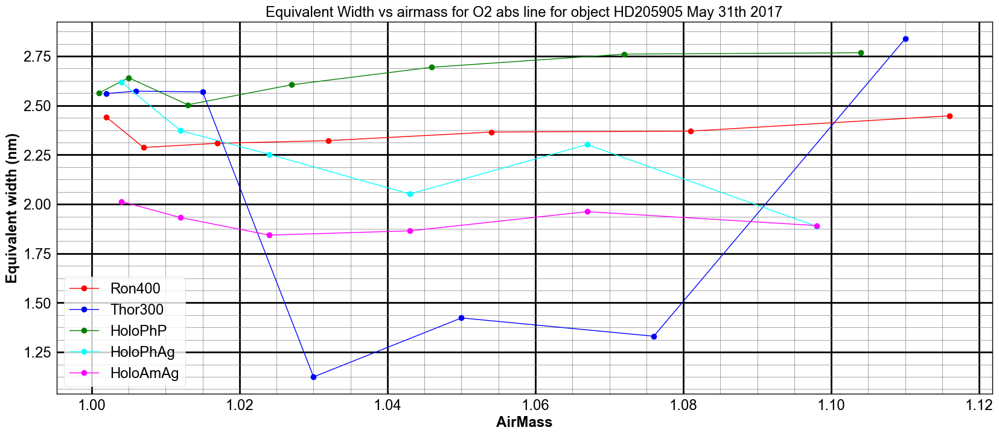

In [193]:
PlotEquivalentWidthVsAirMass(All_eqw_O2_Data,am,'O2 abs line','eqwvsam_O2.pdf')

In [194]:
def PlotEquivalentWidthVsTime(all_eqw_width,all_am,all_dt,tagabsline,figname):
    """
    """
    am0 = []
    eqw0 = []
    tim0 = []
    
    am1 = []
    eqw1 = []
    tim1=[]
    
    am2 = []
    eqw2 = []
    tim2=[]
    
    am3 = []
    eqw3 = []
    tim3=[]
    
    am4 = []
    eqw4 = []
    tim4=[]
    
    date_range = all_dt[NDATA-1] - all_dt[0]
    
    
    for index,eqw in np.ndenumerate(all_eqw_width):
        idx=index[0]
        grating_name=all_filt[idx]
        am=all_am[idx]
        
        
        
        if re.search(ListOfDisperserNames[0],grating_name):
            am0.append(am)
            eqw0.append(eqw)
            tim0.append(all_dt[idx])
        elif re.search(ListOfDisperserNames[1],grating_name):
            am1.append(am)
            eqw1.append(eqw)
            tim1.append(all_dt[idx])
        elif re.search(ListOfDisperserNames[2],grating_name):
            am2.append(am)
            eqw2.append(eqw)
            tim2.append(all_dt[idx])
        elif re.search(ListOfDisperserNames[3],grating_name):
            am3.append(am)
            eqw3.append(eqw)
            tim3.append(all_dt[idx])
        elif re.search(ListOfDisperserNames[4],grating_name):
            am4.append(am)
            eqw4.append(eqw)
            tim4.append(all_dt[idx])
        else:
            print 'disperser ',grating_name,' not found'
            
    fig=plt.figure(figsize=(20,8))

    ax=fig.add_subplot(1,1,1)

    ax.plot_date(tim0,eqw0,'-',marker='o',color='red',lw=1,label=ListOfDisperserNames[0])
    ax.plot_date(tim1,eqw1,'-',marker='o',color='blue',lw=1,label=ListOfDisperserNames[1])
    ax.plot_date(tim2,eqw2,'-',marker='o',color='green',lw=1,label=ListOfDisperserNames[2])
    ax.plot_date(tim3,eqw3,'-',marker='o',color='cyan',lw=1,label=ListOfDisperserNames[3])
    ax.plot_date(tim4,eqw4,'-',marker='o',color='magenta',lw=1,label=ListOfDisperserNames[4])
    
    
    date_range = all_dt[NDATA-1] - all_dt[0]

    if date_range > datetime.timedelta(days = 1):
        ax.xaxis.set_major_locator(mdates.DayLocator(bymonthday=range(1,32), interval=1))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        ax.get_xaxis().set_minor_locator(mdates.HourLocator(byhour=range(0,24,2)))
        #ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
    else:
        ax.xaxis.set_major_locator(mdates.HourLocator(byhour=range(0,24,2)))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
        #ax.get_xaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())
        ax.get_xaxis().set_minor_locator(mdates.MinuteLocator(byminute=range(0,60,5)))
    
    ax.get_yaxis().set_minor_locator(mpl.ticker.AutoMinorLocator())

    ax.grid(b=True, which='major', color='k', linewidth=2.0)
    ax.grid(b=True, which='minor', color='grey', linewidth=0.5)
    ax.set_ylabel('Equivalent width (nm)')
    ax.set_xlabel('time')
#    ax.set_ylim(0.,5.)



    title='Equivalent Width vs airmass for {} for object {}'.format(tagabsline,object_name)

    plt.title(title)
    plt.legend(loc='best')
    
    figfilename=os.path.join(dir_top_images,figname)
    fig.savefig(figfilename)
 

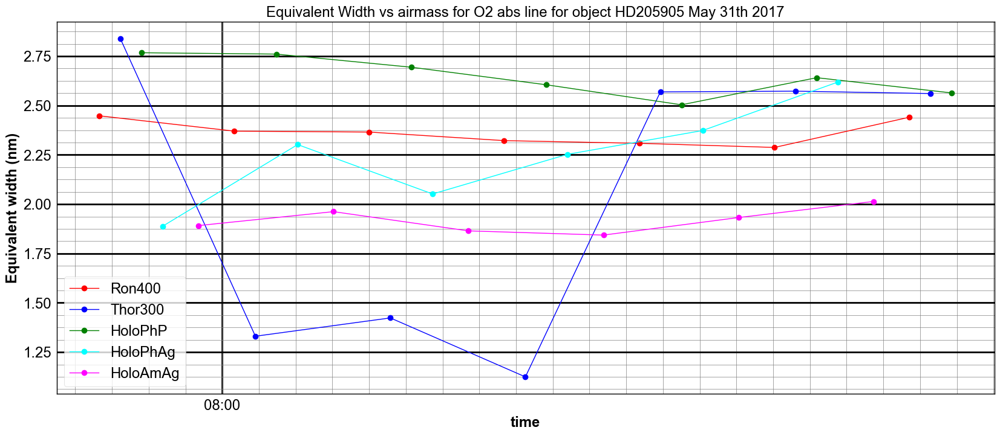

In [195]:
PlotEquivalentWidthVsTime(All_eqw_O2_Data,am,all_dt,'O2 abs line','eqwvstime_O2.pdf')

## B) H2O absorption line
-------------------------------

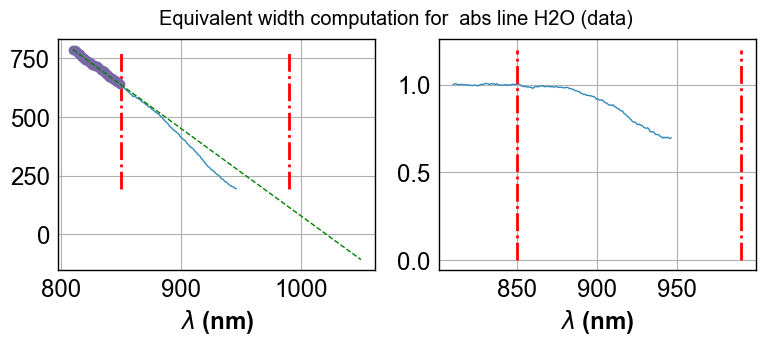

In [196]:
EQW_H2O_DATA = ShowEquivalentWidth2(thewl,thespectrum,810,850,990,1050,' abs line H2O (data)')

In [197]:
#EQW_H2O_SIM = ShowEquivalentWidth2(thewl,thesimspectrum,910,920,984,995,' abs line H2O (sim)')

In [198]:
#print EQW_H2O_SIM,' ' ,EQW_H2O_SIM

In [199]:
#EQW_H2O_DATA = ShowEquivalentWidth(thewl,thespectrum,810,850,980,1000)
WL1_H2O_DATA=810
WL2_H2O_DATA=850
WL3_H2O_DATA=990
WL4_H2O_DATA=1000

In [200]:
#EQW_H2O_SIM = ShowEquivalentWidth(thewl,thesimspectrum,910,920,984,995)
WL1_H2O_SIM=910
WL2_H2O_SIM=920
WL3_H2O_SIM=984
WL4_H2O_SIM=995

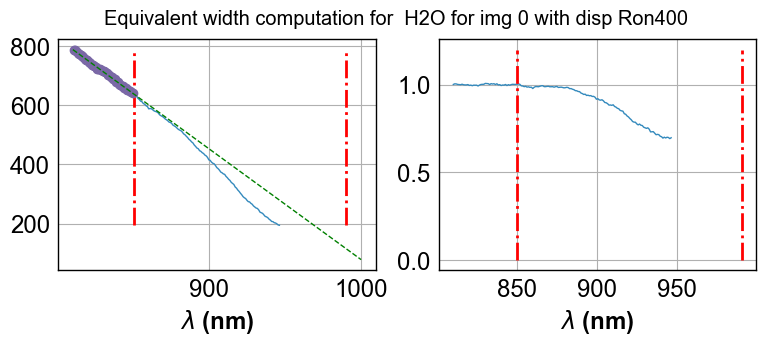

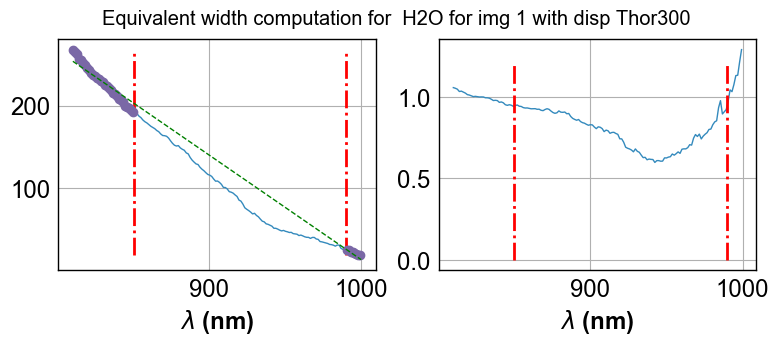

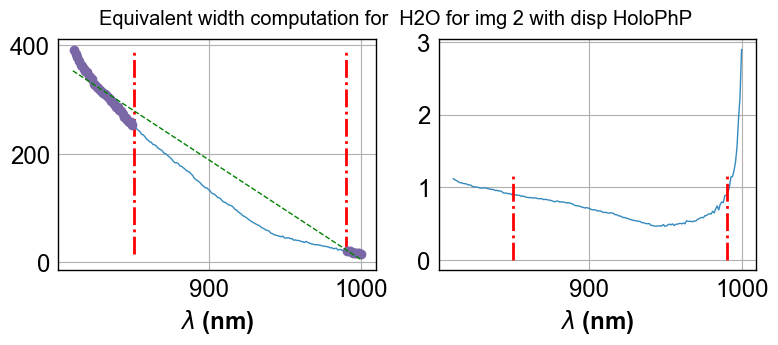

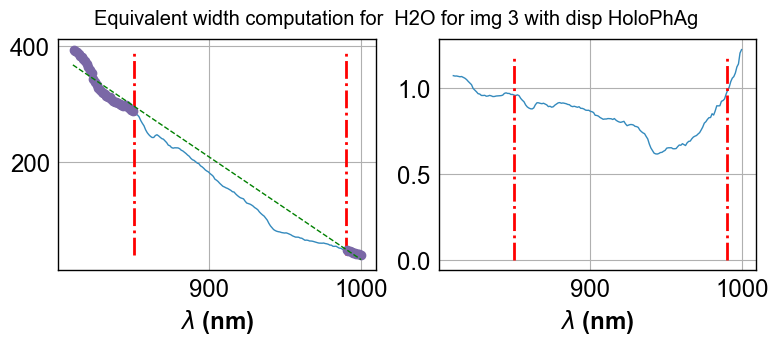

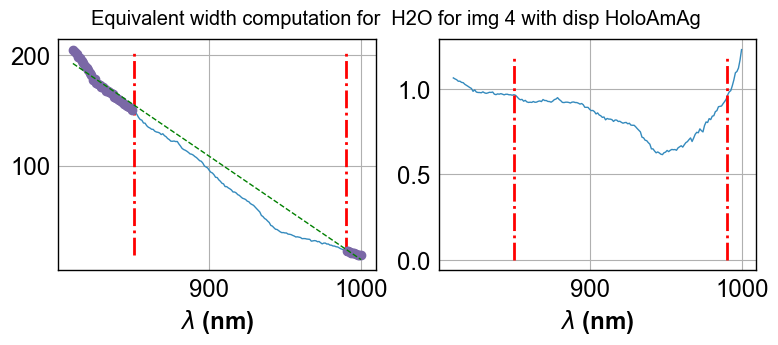

...

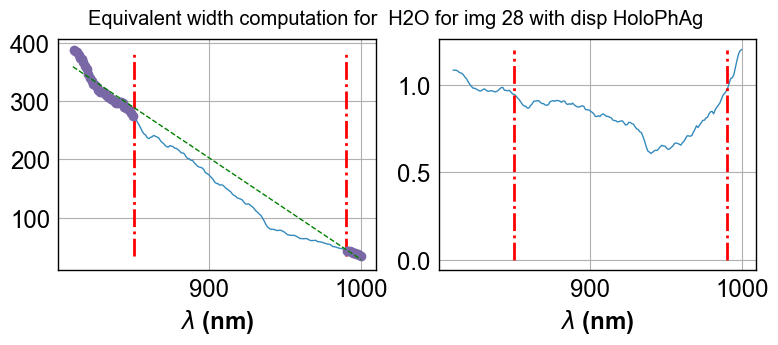

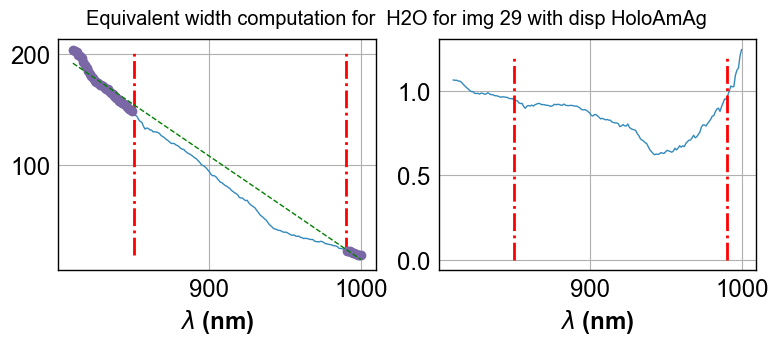

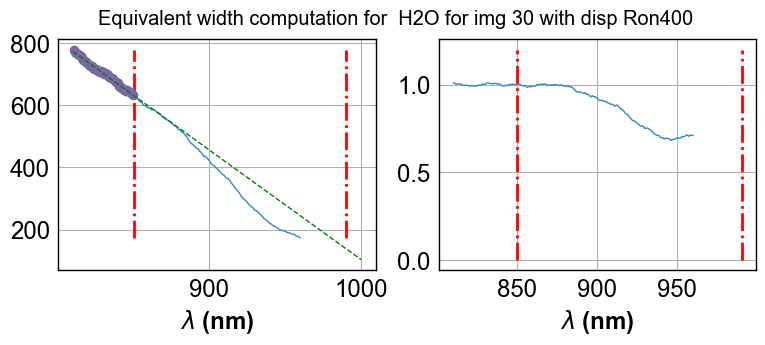

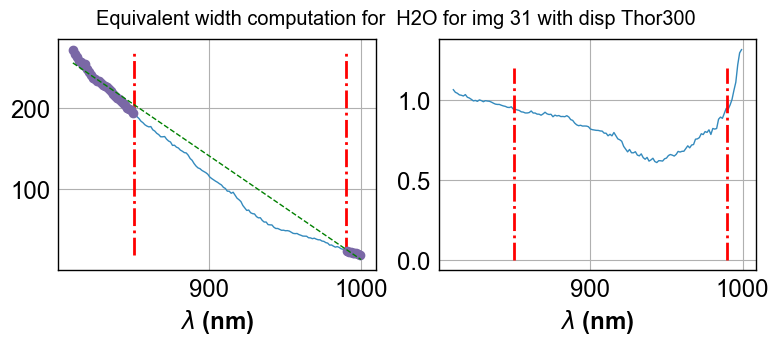

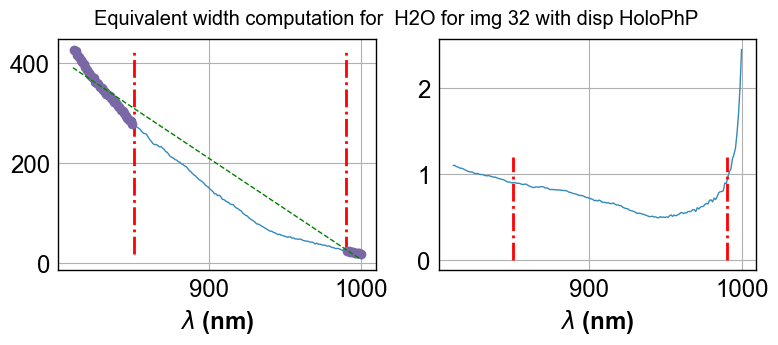

In [201]:
ShowAllEquivalentWidth(all_rightspectra_wl,all_rightspectra_data,WL1_H2O_DATA,WL2_H2O_DATA,WL3_H2O_DATA,WL4_H2O_DATA,' H2O')

In [202]:
All_eqw_H2O_Data=ComputeAllEquivalentWidth(all_rightspectra_wl,all_rightspectra_data,WL1_H2O_DATA,WL2_H2O_DATA,WL3_H2O_DATA,WL4_H2O_DATA)

In [203]:
#All_eqw_H2O_Sim=ComputeAllEquivalentWidth(all_rightspectra_wl,all_rightspectra_sim,WL1_H2O_SIM,WL2_H2O_SIM,WL3_H2O_SIM,WL4_H2O_SIM)

In [204]:
#All_eqw_H2O_Data

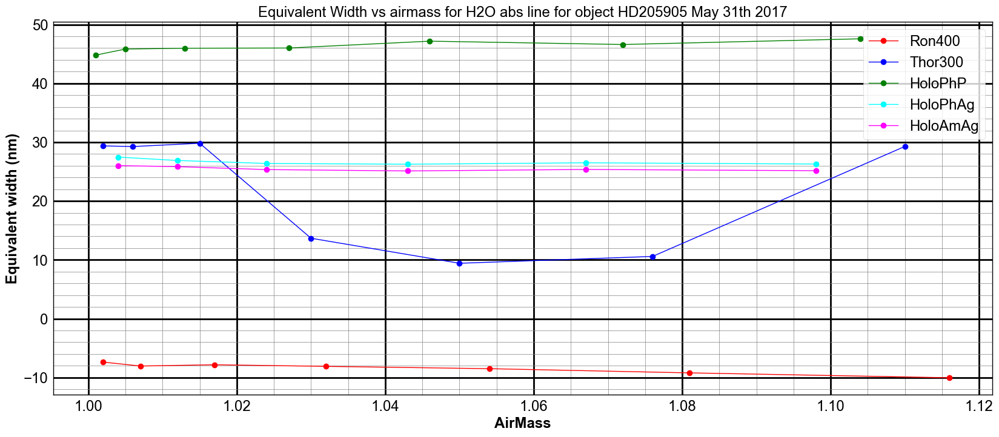

In [205]:
PlotEquivalentWidthVsAirMass(All_eqw_H2O_Data,am,'H2O abs line','eqwvsam_H2O.pdf')

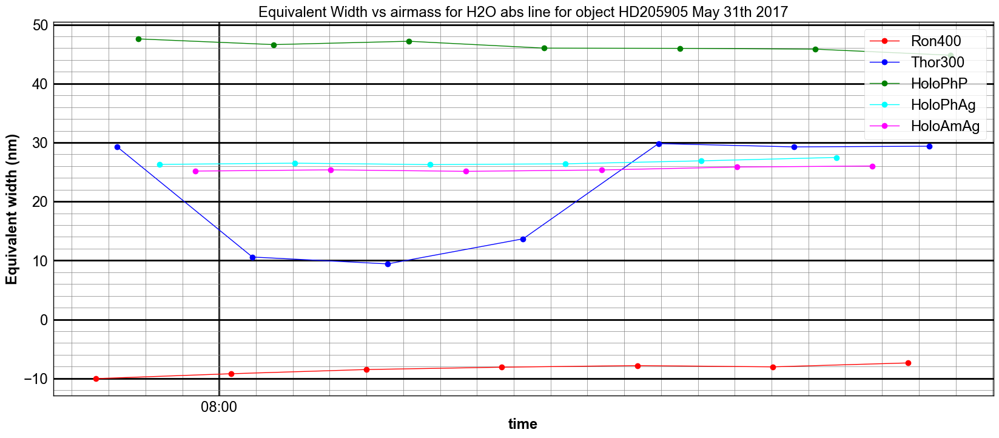

In [206]:
PlotEquivalentWidthVsTime(All_eqw_H2O_Data,am,all_dt,'H2O abs line','eqwvstime_H20.pdf')

## C) HBETA absorption line
-------------------------------

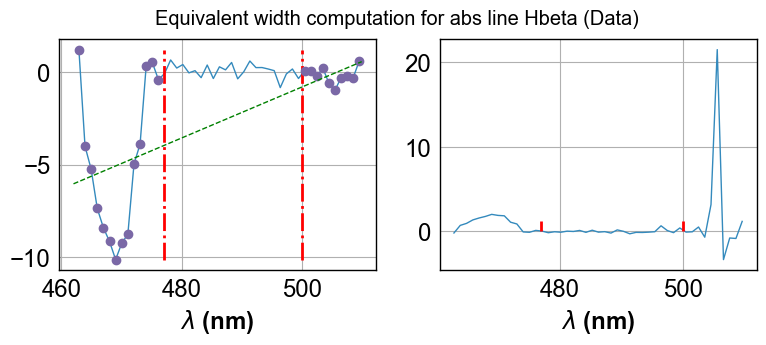

In [207]:
EQW_BETA_DATA = ShowEquivalentWidth2(thewl,thespectrum,462,477,500,510,'abs line Hbeta (Data)')

In [208]:
WL1_HBETA_DATA=470
WL2_HBETA_DATA=480
WL3_HBETA_DATA=500
WL4_HBETA_DATA=510

In [209]:
WL1_HBETA_SIM=462
WL2_HBETA_SIM=477
WL3_HBETA_SIM=500
WL4_HBETA_SIM=510

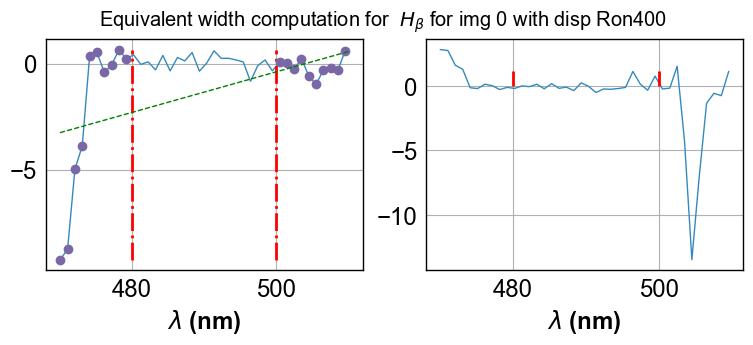

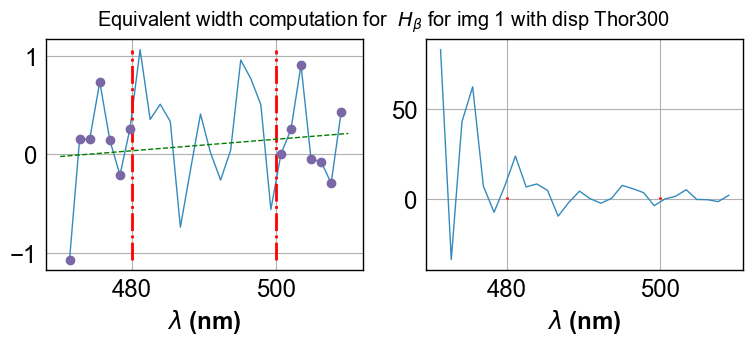

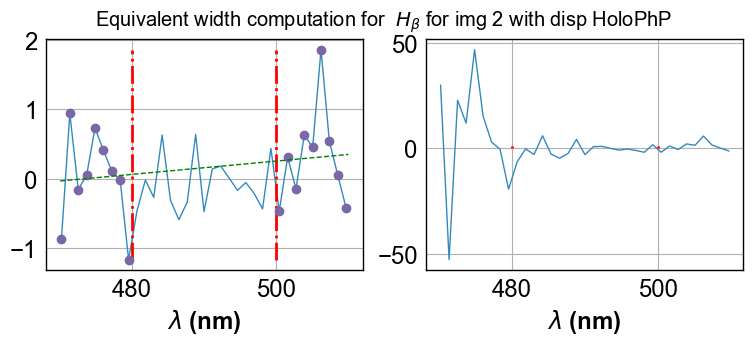

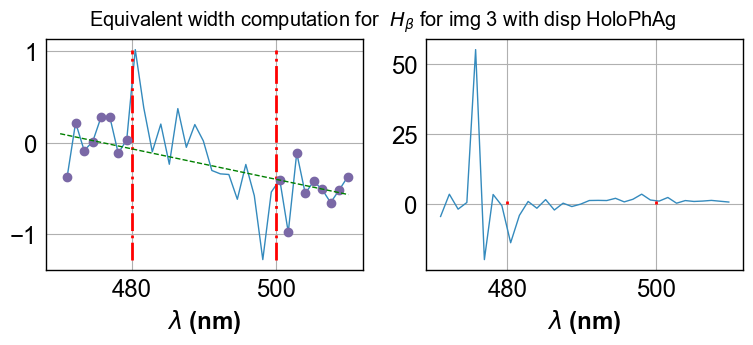

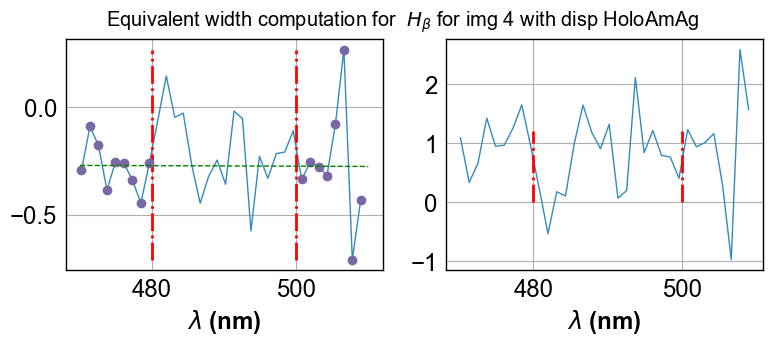

...

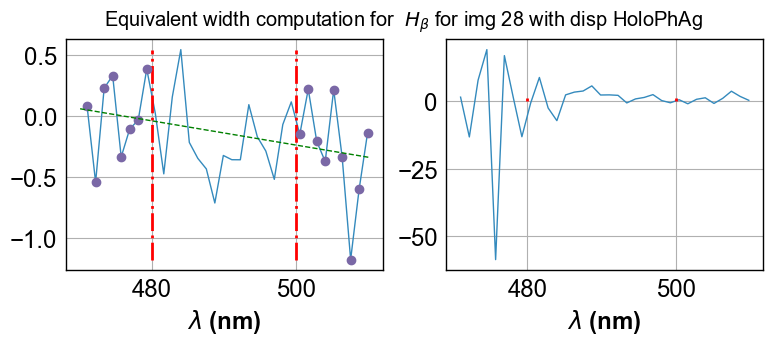

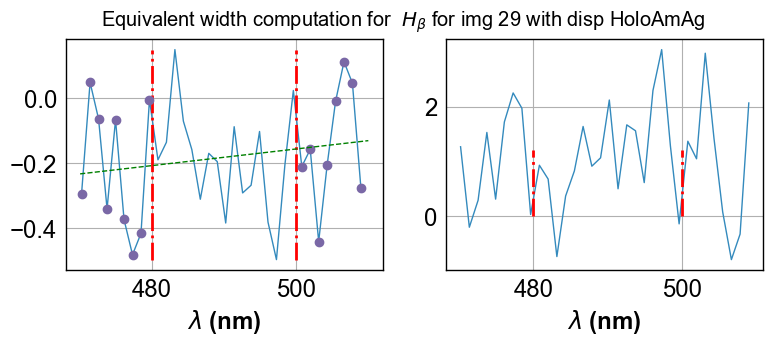

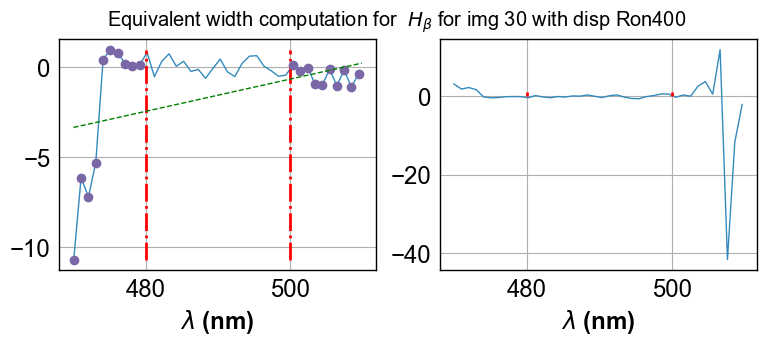

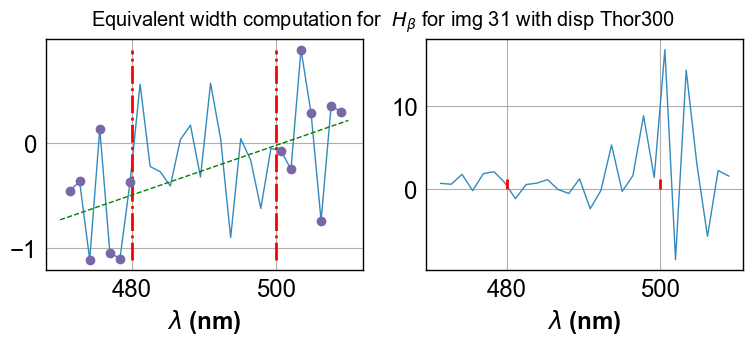

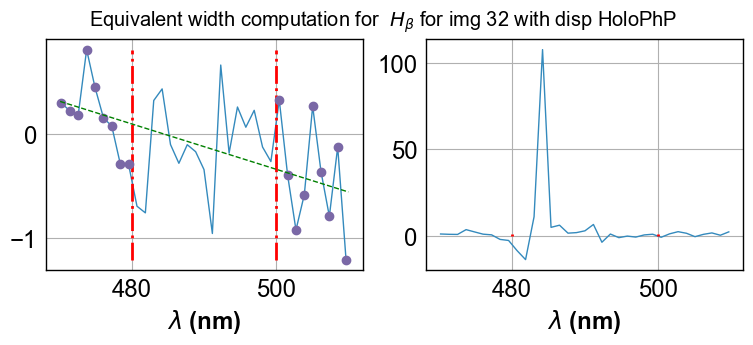

In [210]:
ShowAllEquivalentWidth(all_rightspectra_wl,all_rightspectra_data,WL1_HBETA_DATA,WL2_HBETA_DATA,WL3_HBETA_DATA,WL4_HBETA_DATA,' $H_\\beta$')

In [211]:
All_eqw_HBETA_Data=ComputeAllEquivalentWidth(all_rightspectra_wl,all_rightspectra_data,WL1_HBETA_DATA,WL2_HBETA_DATA,WL3_HBETA_DATA,WL4_HBETA_DATA)

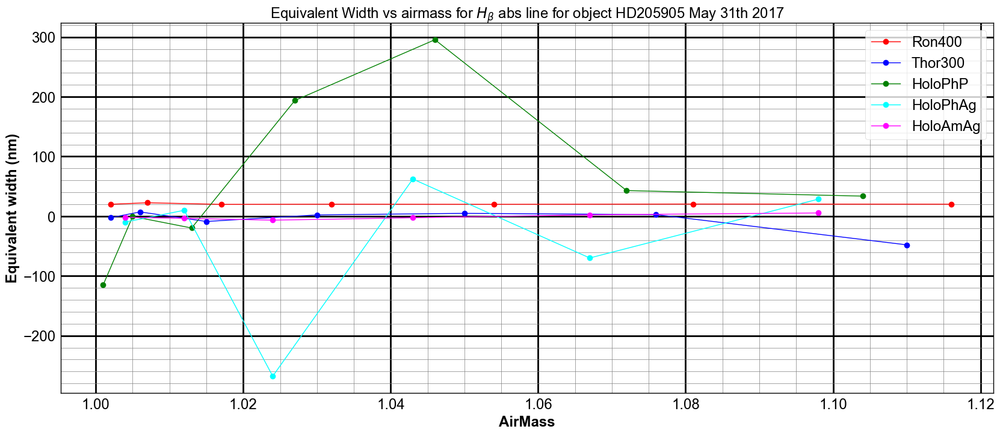

In [212]:
PlotEquivalentWidthVsAirMass(All_eqw_HBETA_Data,am,'$H_\\beta$ abs line','eqwvsam_HBETA.pdf')

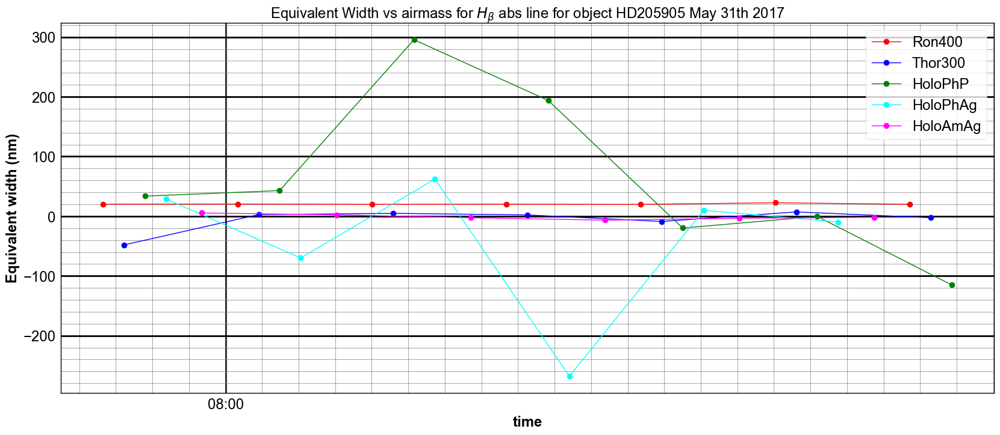

In [213]:
PlotEquivalentWidthVsTime(All_eqw_HBETA_Data,am,all_dt,'$H_\\beta$ abs line','eqwvstime_HBETA.pdf')

## D) HALPHA absorption line
-------------------------------------

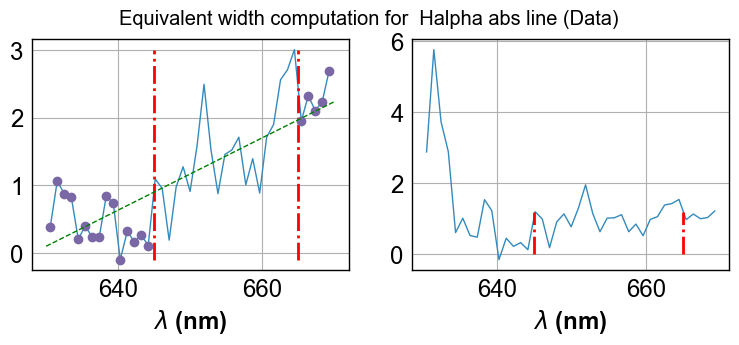

In [214]:
EQW_HALPHA_DATA = ShowEquivalentWidth2(thewl,thespectrum,630,645,665,670,' Halpha abs line (Data)') 

In [215]:
#EQW_HALPHA_SIM = ShowEquivalentWidth2(thewl,thesimspectrum,630,640,670,675,' Halpha abs line (Sim)') 

In [216]:
WL1_HALPHA_DATA=630
WL2_HALPHA_DATA=640
WL3_HALPHA_DATA=665
WL4_HALPHA_DATA=670

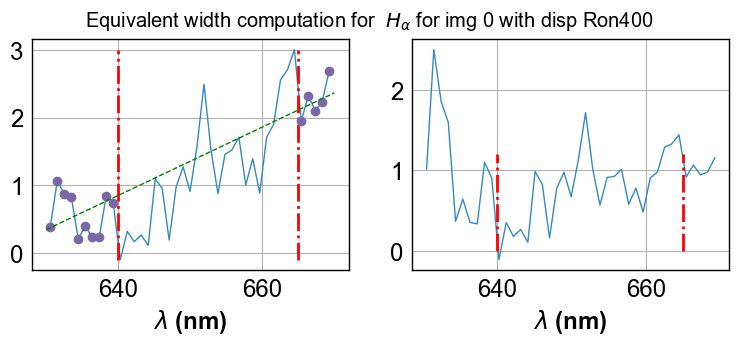

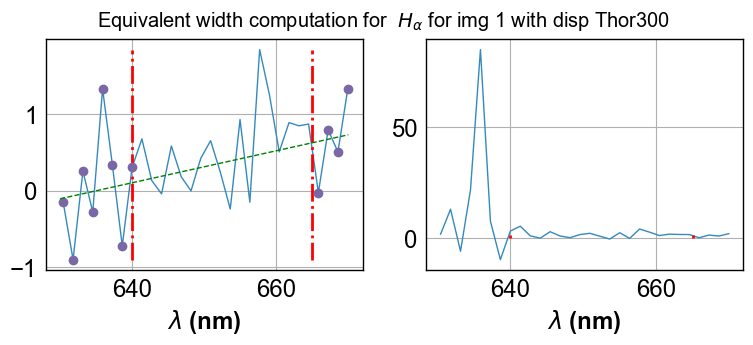

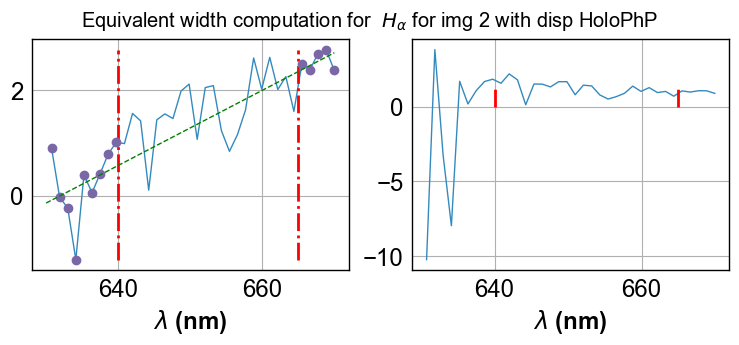

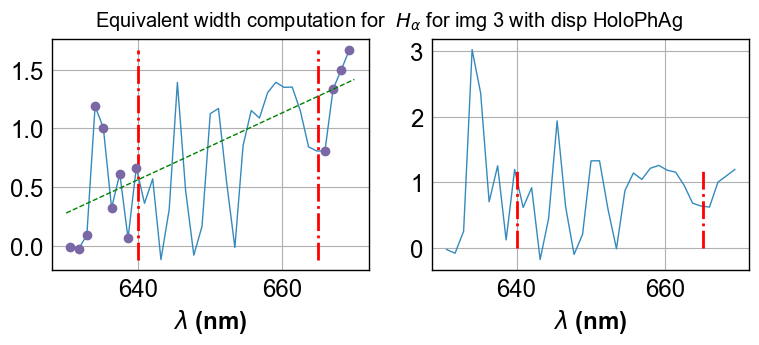

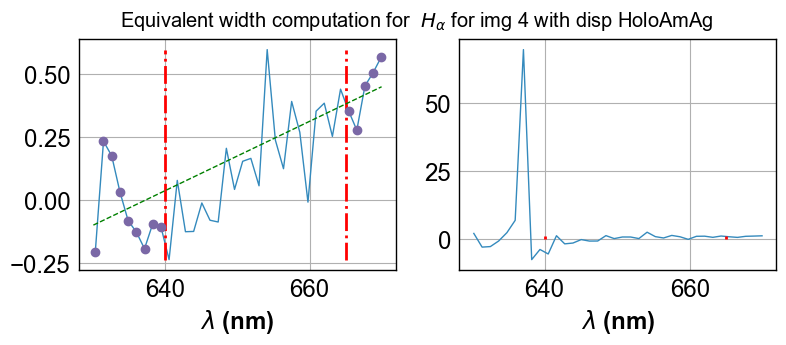

...

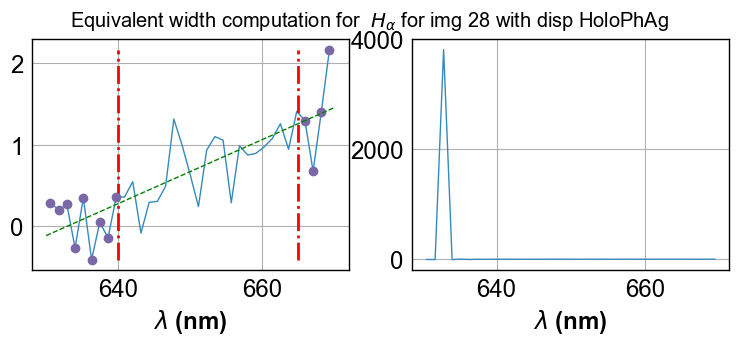

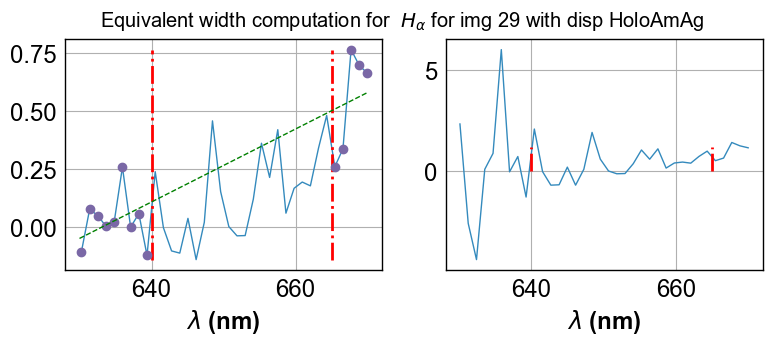

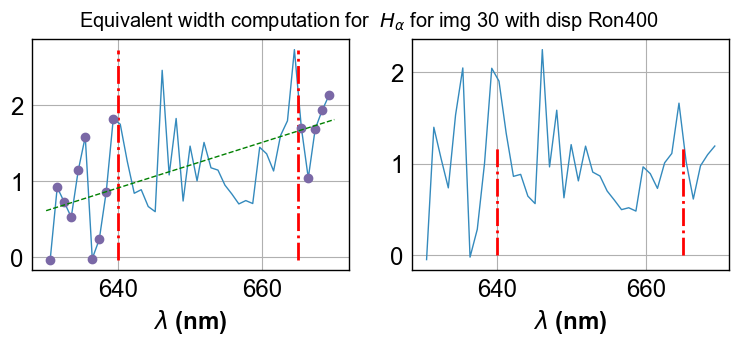

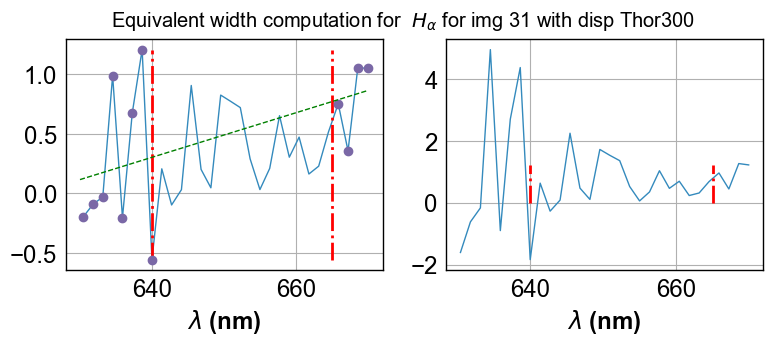

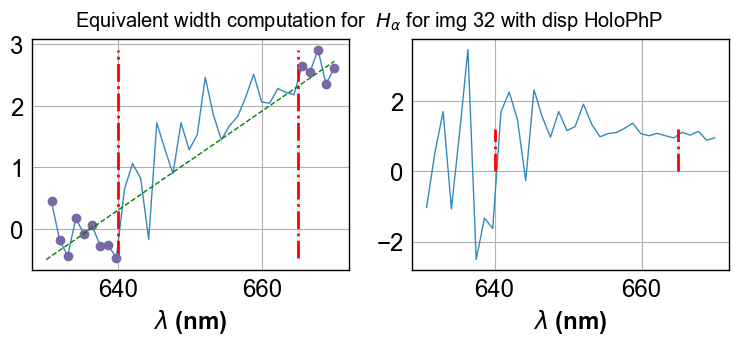

In [217]:
ShowAllEquivalentWidth(all_rightspectra_wl,all_rightspectra_data,WL1_HALPHA_DATA,WL2_HALPHA_DATA,WL3_HALPHA_DATA,WL4_HALPHA_DATA,' $H_\\alpha$')

In [218]:
All_eqw_HALPHA_Data=ComputeAllEquivalentWidth(all_rightspectra_wl,all_rightspectra_data,WL1_HALPHA_DATA,WL2_HALPHA_DATA,WL3_HALPHA_DATA,WL4_HALPHA_DATA)

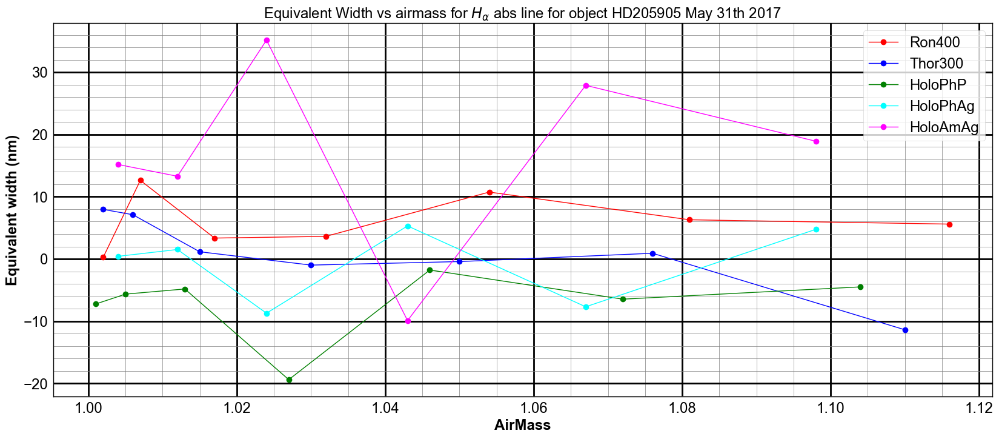

In [219]:
PlotEquivalentWidthVsAirMass(All_eqw_HALPHA_Data,am,'$H_\\alpha$ abs line','eqwvsam_HALPHA.pdf')

In [220]:
#All_eqw_HALPHA_Sim=ComputeAllEquivalentWidth(all_rightspectra_wl,all_rightspectra_sim,WL1_HALPHA_SIM,WL2_HALPHA_SIM,WL3_HALPHA_SIM,WL4_HALPHA_SIM)

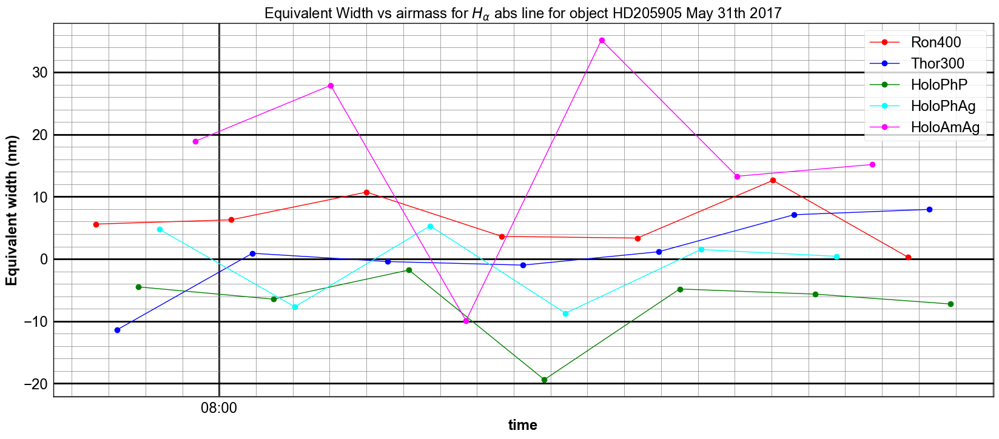

In [221]:
PlotEquivalentWidthVsTime(All_eqw_HALPHA_Data,am,all_dt,'$H_\\alpha$ abs line','eqwvstime_HALPHA.pdf')